<a href="https://colab.research.google.com/github/zohrehRezaei/Edge-Detection/blob/main/Task_1_Zohreh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Connecting to google drive 

In [ ]:
#Upload "dicom_dir.zip" on google drive before running this part
 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Unzip and read "dicom_dir.zip"

In [ ]:
#Unzip "dicom_dir.zip" in "/tmp" folder

import zipfile
import os

os.mkdir("/tmp/dicom_dir")
zip_ref = zipfile.ZipFile('/content/drive/MyDrive/dicom_dir.zip', 'r') #Opens the zip file in read mode
zip_ref.extractall('/tmp/dicom_dir') #Extracts the files into the /tmp folder
zip_ref.close()

# Instalation needed package

In [ ]:
!pip install pydicom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 2.0 MB 5.2 MB/s 


# Metadata to csv

In [ ]:
import csv
import pydicom
from pydicom.data import get_testdata_file


folder_path = "/tmp/dicom_dir"
images_path = os.listdir(folder_path)

for i in range(len(images_path)):
  ds = pydicom.dcmread(folder_path+'/'+images_path[i],stop_before_pixels=True)
  with open('metadata.csv', 'a', newline='') as csvfile:
   writer = csv.writer(csvfile)
   writer.writerow("Group Elem Description VR value".split())
   for elem in ds:
      writer.writerow([
        f"{elem.tag.group:04X}", f"{elem.tag.element:04X}",
            elem.description(), elem.VR, str(elem.value)
        ])

In [ ]:
!pip install dicom-csv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for dicom-csv: filename=dicom_csv-0.2.5-py3-none-any.whl size=20529 sha256=48eba219a383496593535d88c2c12f46d0d38f96656d155d1e99f6f23e5cb5f5
  Stored in directory: /root/.cache/pip/wheels/3d/1f/35/79b12990d2485bf2019d686e673fb37b9c9fcdd6addac594d0
Successfully built dicom-csv


In [ ]:
from dicom_csv import join_tree
import csv

folder = '/tmp/dicom_dir'
meta = join_tree(folder, verbose=2)
meta.to_csv("metadata.csv")

ID_0036_AGE_0074_CONTRAST_1_CT.dcm: : 100it [00:01, 69.67it/s]


# Pixel array ***(Patient's Age>80)***

In [ ]:
from pydicom import dcmread
import cv2
import os

folder_path = "/tmp/dicom_dir"
images_path = os.listdir(folder_path)

os.mkdir("/tmp/up_to_80")
# Specify the output jpg/png folder path
jpg_folder_path = "/tmp/up_to_80"

for i, image in enumerate(images_path):
  ds = dcmread(folder_path+'/'+images_path[i])
  age=int(''.join(c for c in (ds.PatientAge) if c.isdigit()))


  if age>80:
      pixel_array_numpy = ds.pixel_array
      image = image.replace('.dcm', '.jpg')
      cv2.imwrite(os.path.join(jpg_folder_path, image), pixel_array_numpy)


# **Edge Detection**

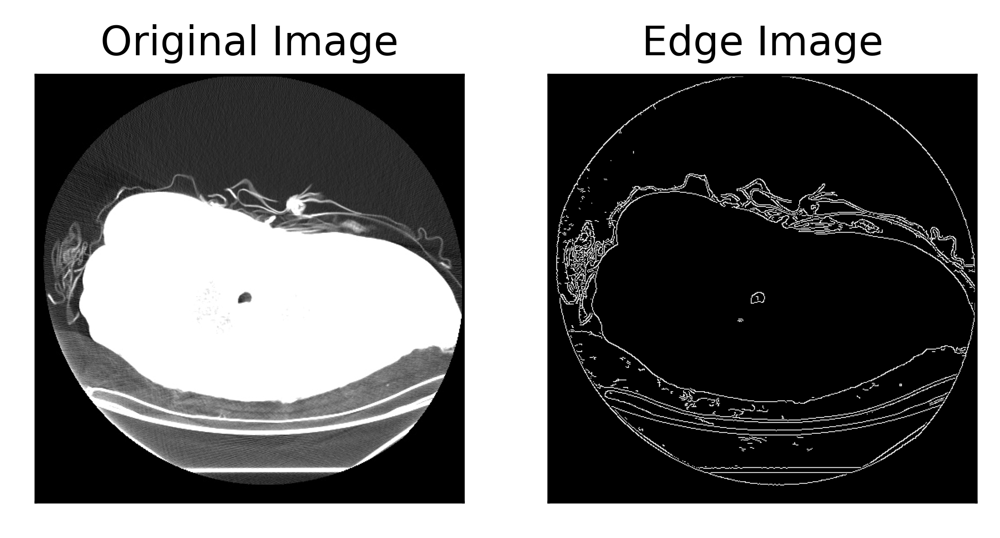

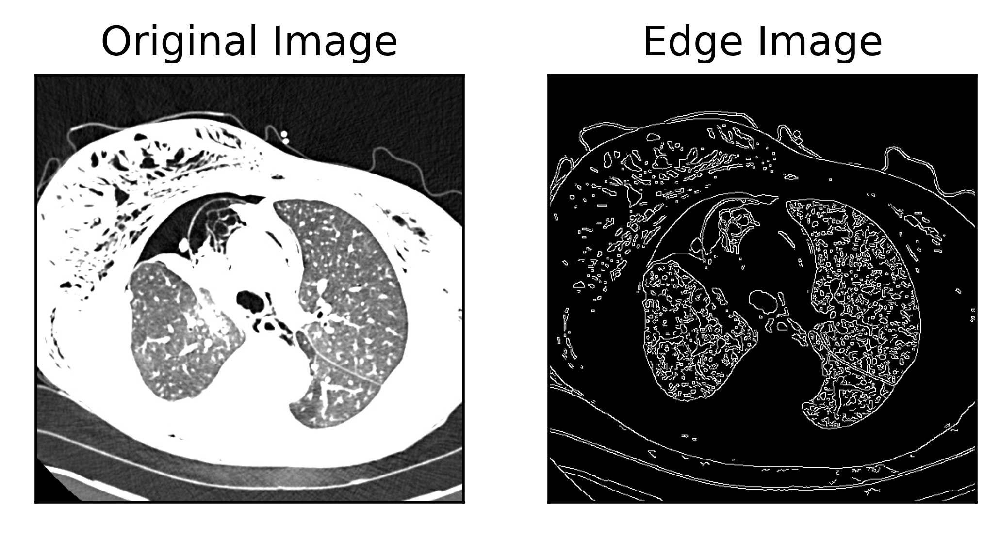

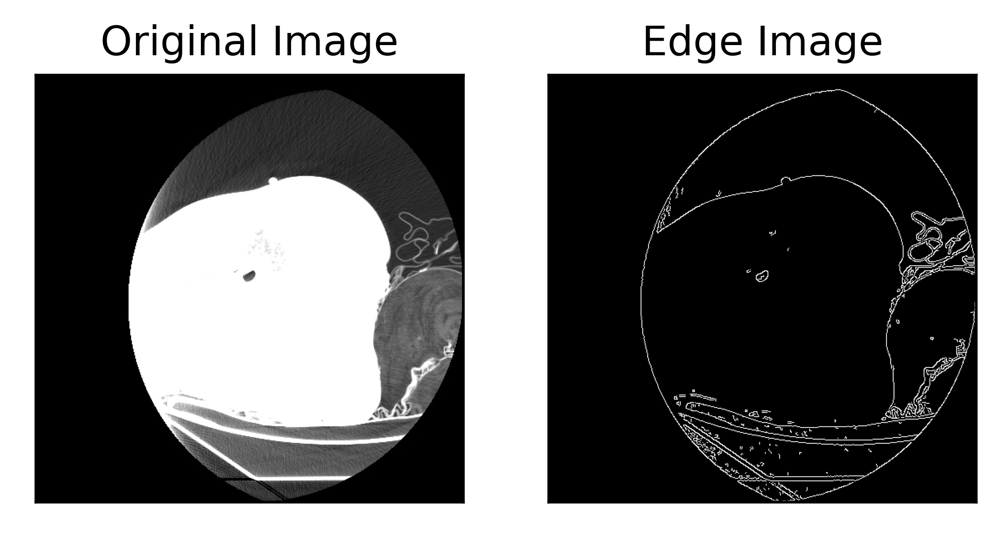

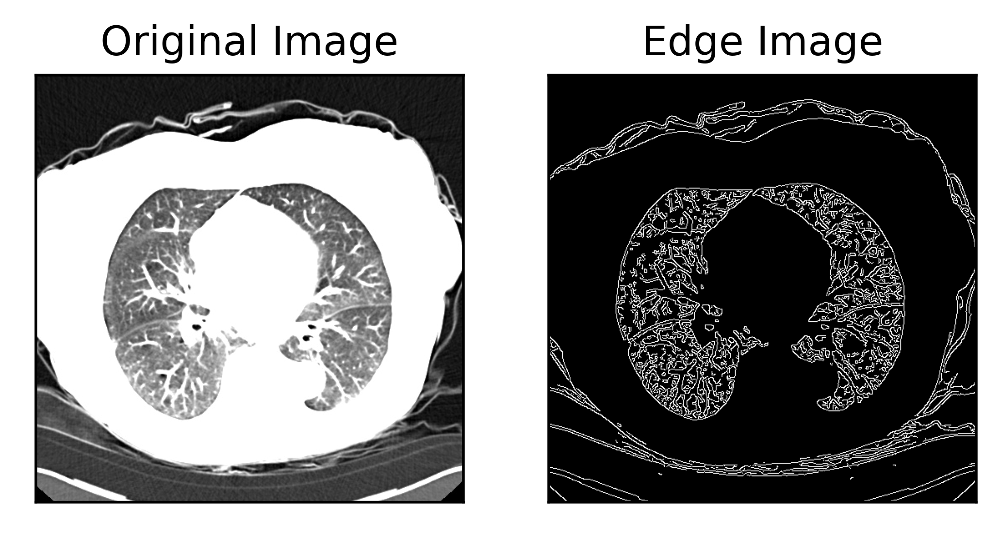

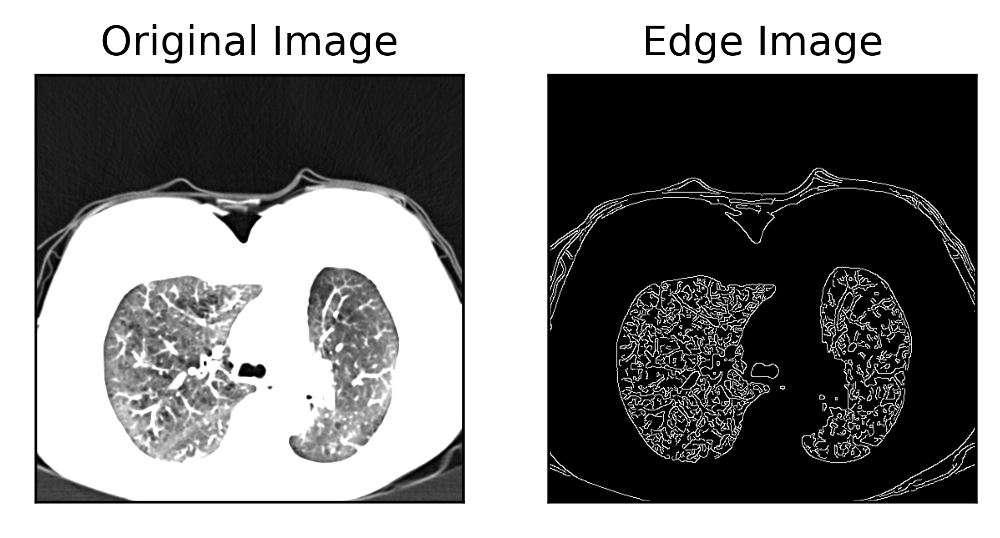

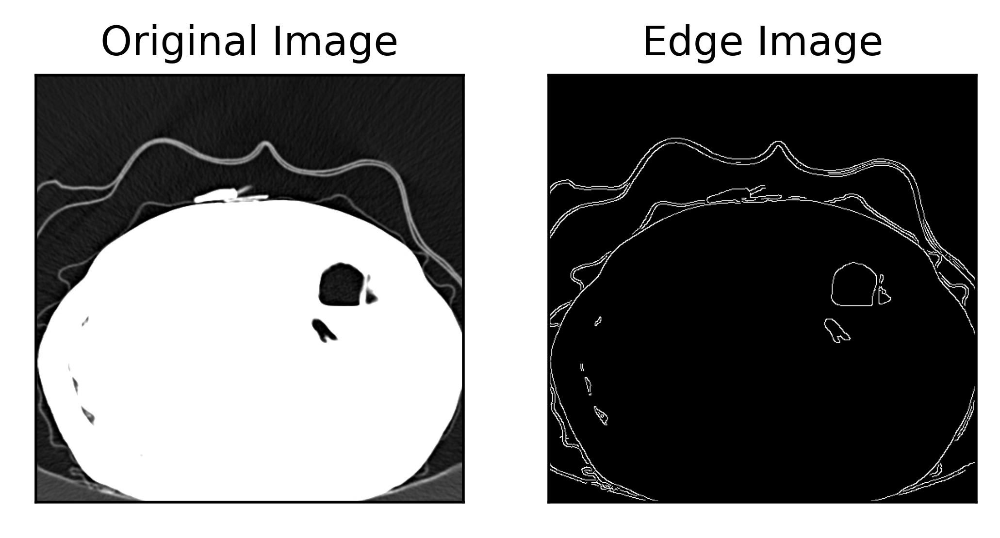

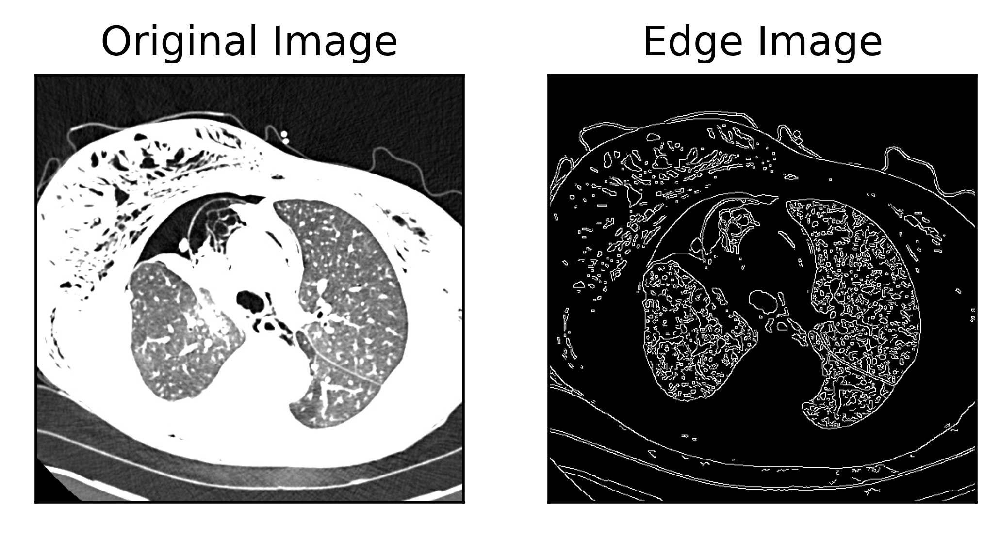

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

folder_path="/tmp/up_to_80"
images_path=os.listdir(folder_path)


os.mkdir("/tmp/edge_detected")
new_folder_path="/tmp/edge_detected"

for i, image in enumerate(images_path):

  img=cv2.imread(folder_path+'/'+images_path[i],0)
  edges = cv2.Canny(img,100,200)
  
  #equalized = cv2.equalizeHist(img)

  
  #pixel_array_numpy=img.pixel_array
  #res = np.hstack((image,edges)).shape #stacking images side-by-side
  #cv2.imwrite(os.path.join(new_folder_path, edges), pixel_array_numpy)

  plt.figure(figsize=(5, 3), dpi=500)
  plt.subplot(121),plt.imshow(img,cmap = 'gray')
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(edges,cmap = 'gray')
  plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
  plt.savefig(new_folder_path+'/'+images_path[i], dpi=500, bbox_inches='tight')

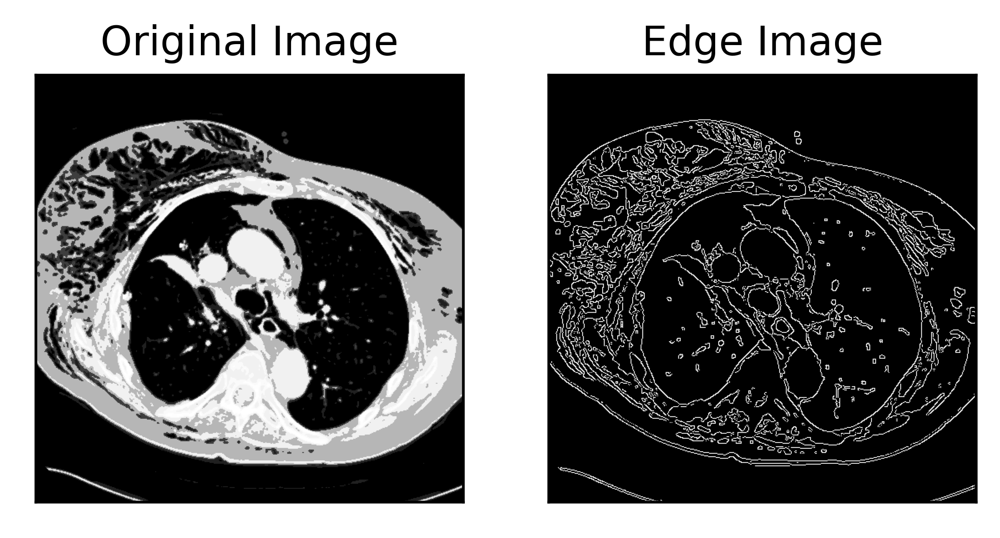

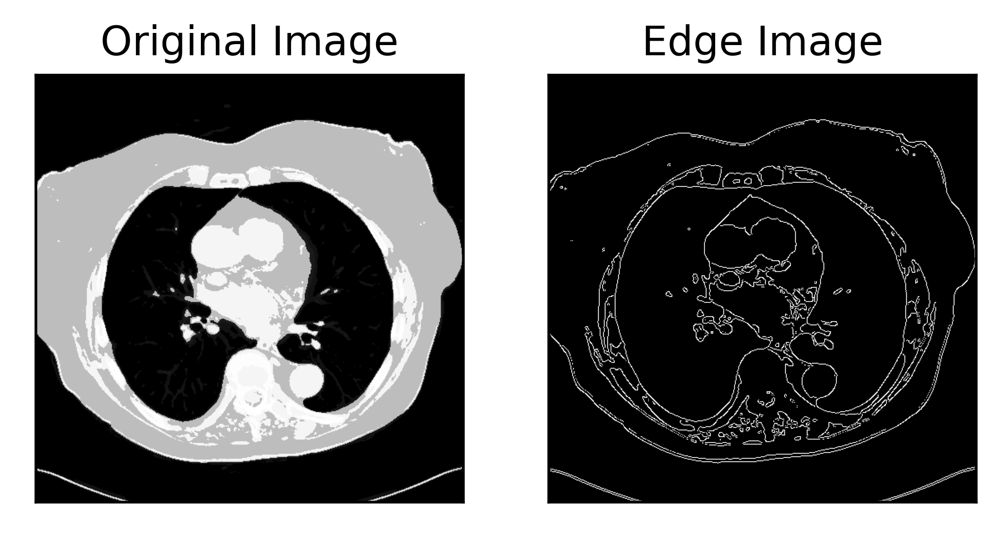

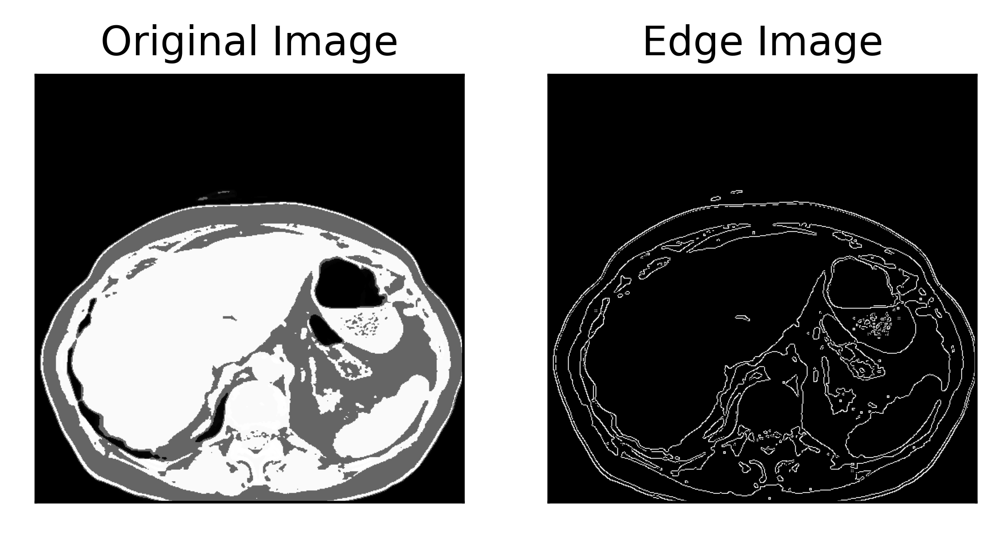

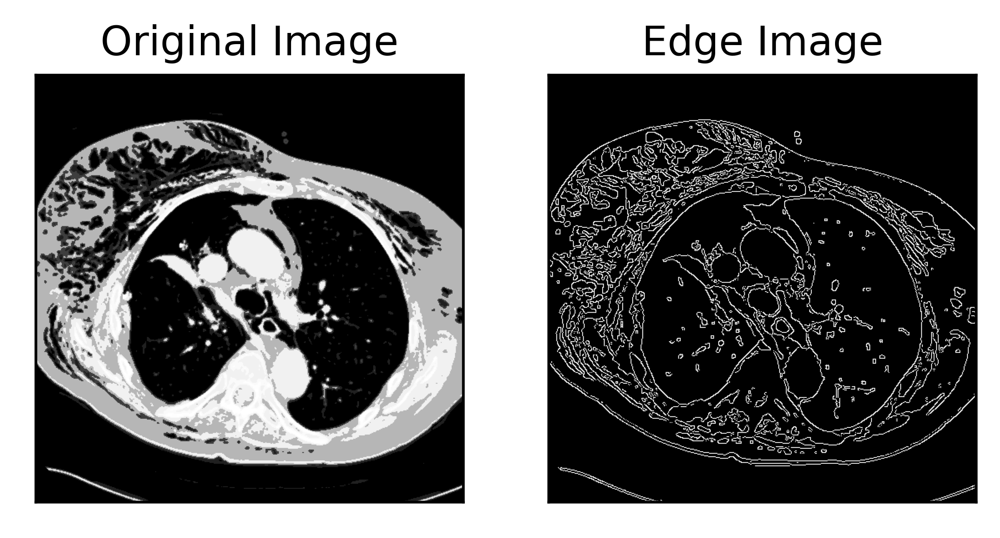

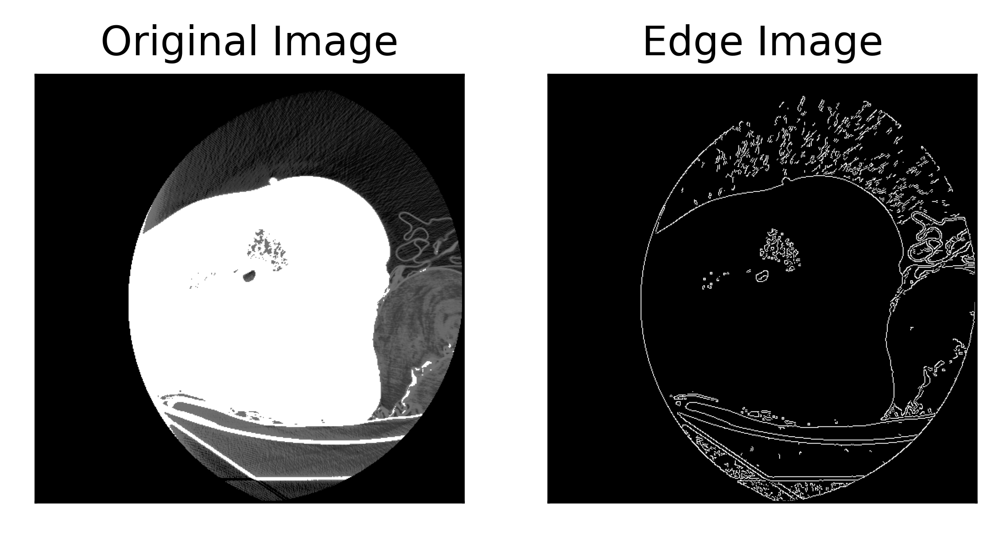

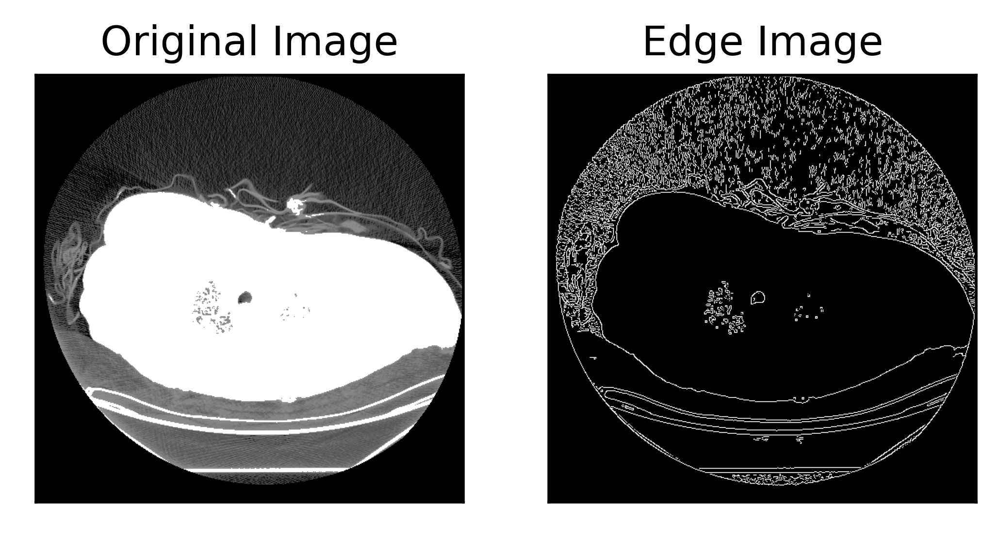

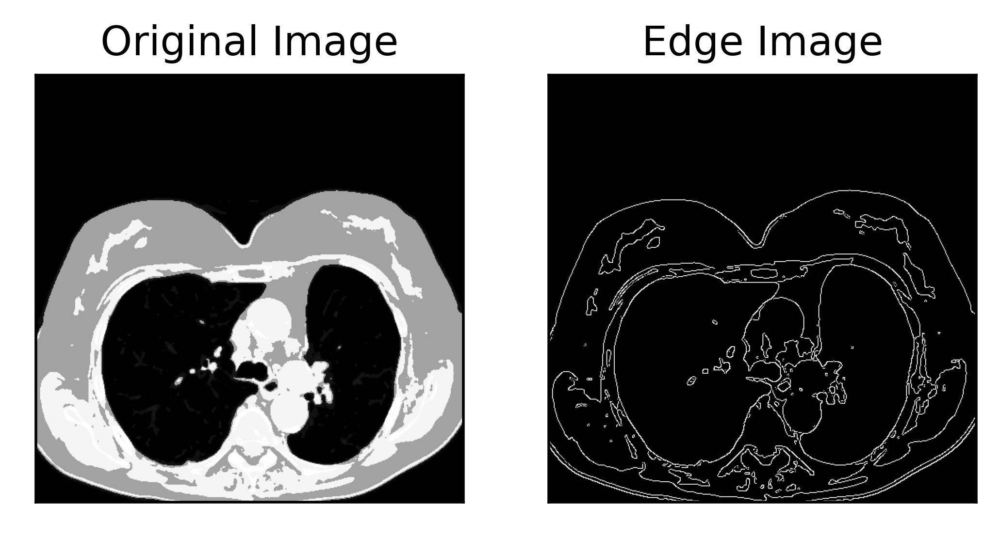

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os

folder_path="/tmp/up_to_80"
images_path=os.listdir(folder_path)


os.mkdir("/tmp/upTo80_edge_detected")
new_folder_path="/tmp/upTo80_edge_detected"

for i, image in enumerate(images_path):

  img=cv2.imread(folder_path+'/'+images_path[i],0)
  equalized = cv2.equalizeHist(img)

  edges = cv2.Canny(equalized,100,200)
  #pixel_array_numpy=img.pixel_array
  #res = np.hstack((image,edges)).shape #stacking images side-by-side
  #cv2.imwrite(os.path.join(new_folder_path, edges), pixel_array_numpy)

  plt.figure(figsize=(5, 3), dpi=500)
  plt.subplot(121),plt.imshow(equalized,cmap = 'gray')
  plt.title('Original Image'), plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(edges,cmap = 'gray')
  plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
  plt.savefig(new_folder_path+'/'+images_path[i], dpi=500, bbox_inches='tight')


#plt.show()

# **Visualisation**

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     \ 21.9 MB 141 kB/s
     |████████████████████████████████| 596 kB 12.2 MB/s 
     |████████████████████████████████| 102 kB 48.1 MB/s 
     |████████████████████████████████| 690 kB 50.0 MB/s 
     |████████████████████████████████| 4.7 MB 55.6 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 812 kB 41.9 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=9782c95c62089ca18403d40902b680686dda6fd9e777f80c14356994e3b23b3d
  Stored in directory: /tmp/pip-ephem-wheel-cache-3103nnb5/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=df7b31cf589776ccc94279f5d88a9a0fbe4bf6fa9e8fb0115980ba475e42b39e
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba86876882394

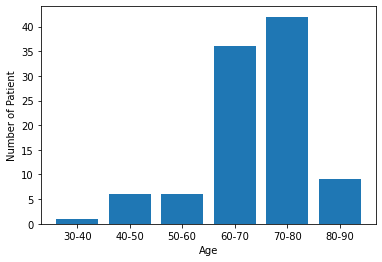

In [ ]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
from matplotlib import pyplot as plt


df=pd.read_csv("meta.csv")

df2=pd.DataFrame([df.PatientAge,df.PatientSex,df.Modality,df.SmokingStatus,df.ProtocolName,df.PregnancyStatus,df.Manufacturer]).transpose()

#profile=ProfileReport(df2)
#df2.groupby("PatientAge")["PatientSex"].count()
age=[]
for i in range(0,100):
  age.append(int(''.join(c for c in (df2.PatientAge[i]) if c.isdigit())))

age_range=[]
grouped_age=[]
first=30
for i in range(30,90,10):
   age_range.append([i,i+10])
   cv =sum(age.count(j) for j in range(i,i+10))
   grouped_age.append(cv)

plt.bar(["30-40","40-50","50-60","60-70","70-80","80-90"],grouped_age)
plt.ylabel("Number of Patient")
#plt.legend(["Blank Valids", "Blank Deads"])
plt.xlabel("Age")


plt.show()
